<a href="https://colab.research.google.com/github/ahhhlexli/Beer-Price-Checker/blob/main/Beer_Brand_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Beer Price Model - CNN

# Imports

In [ ]:
import numpy as np
import os
import pathlib
import PIL
import PIL.Image
import tensorflow as tf 
import keras
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras import layers
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.callbacks import ReduceLROnPlateau
from PIL import Image, ImageOps
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout, SpatialDropout2D
from tensorflow.keras.layers import AveragePooling2D, MaxPooling2D, GlobalAveragePooling2D, GlobalMaxPooling2D

# Load Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
batch_size = 32
img_height = 224
img_width = 168

data_dir = '/content/drive/MyDrive/Group Project - Beer Price Checker/0BrandModel3'

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=1,
  label_mode='int',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3577 files belonging to 18 classes.
Using 2862 files for training.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=1,
  label_mode='int',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 3577 files belonging to 18 classes.
Using 715 files for validation.


In [ ]:
class_names = train_ds.class_names
print(class_names)

['Asahi', 'Blue Girl', 'Blue Ice', 'Budweiser', 'Carlsberg', 'Corona Extra', 'Guinness', 'Heineken', 'Kingway', 'Kirin', 'San Mig', 'San Miguel', 'Skol Beer', 'Sol', 'Stella Artois', 'Tiger', 'Tsingtao Beer', 'Yanjing Beer']


In [ ]:
class_list = list(enumerate(class_names))
print(class_list)

class_dict = {}

for num, brand in class_list:
  class_dict[num] = brand

print(class_dict)

[(0, 'Asahi'), (1, 'Blue Girl'), (2, 'Blue Ice'), (3, 'Budweiser'), (4, 'Carlsberg'), (5, 'Corona Extra'), (6, 'Guinness'), (7, 'Heineken'), (8, 'Kingway'), (9, 'Kirin'), (10, 'San Mig'), (11, 'San Miguel'), (12, 'Skol Beer'), (13, 'Sol'), (14, 'Stella Artois'), (15, 'Tiger'), (16, 'Tsingtao Beer'), (17, 'Yanjing Beer')]
{0: 'Asahi', 1: 'Blue Girl', 2: 'Blue Ice', 3: 'Budweiser', 4: 'Carlsberg', 5: 'Corona Extra', 6: 'Guinness', 7: 'Heineken', 8: 'Kingway', 9: 'Kirin', 10: 'San Mig', 11: 'San Miguel', 12: 'Skol Beer', 13: 'Sol', 14: 'Stella Artois', 15: 'Tiger', 16: 'Tsingtao Beer', 17: 'Yanjing Beer'}


In [ ]:
train_dist = {i : 0 for i in class_names}
print(train_dist)

val_dist = {i : 0 for i in class_names}
print(val_dist)

{'Asahi': 0, 'Blue Girl': 0, 'Blue Ice': 0, 'Budweiser': 0, 'Carlsberg': 0, 'Corona Extra': 0, 'Guinness': 0, 'Heineken': 0, 'Kingway': 0, 'Kirin': 0, 'San Mig': 0, 'San Miguel': 0, 'Skol Beer': 0, 'Sol': 0, 'Stella Artois': 0, 'Tiger': 0, 'Tsingtao Beer': 0, 'Yanjing Beer': 0}
{'Asahi': 0, 'Blue Girl': 0, 'Blue Ice': 0, 'Budweiser': 0, 'Carlsberg': 0, 'Corona Extra': 0, 'Guinness': 0, 'Heineken': 0, 'Kingway': 0, 'Kirin': 0, 'San Mig': 0, 'San Miguel': 0, 'Skol Beer': 0, 'Sol': 0, 'Stella Artois': 0, 'Tiger': 0, 'Tsingtao Beer': 0, 'Yanjing Beer': 0}


In [ ]:

for images, labels in train_ds.take(-1):  # only take first element of dataset
    #numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    for i in numpy_labels:
      train_dist[class_dict[i]] += 1

for images, labels in val_ds.take(-1):  # only take first element of dataset
    #numpy_images = images.numpy()
    numpy_labels = labels.numpy()
    for i in numpy_labels:
      val_dist[class_dict[i]] += 1

print(train_dist)
print(val_dist)

{'Asahi': 114, 'Blue Girl': 243, 'Blue Ice': 141, 'Budweiser': 133, 'Carlsberg': 95, 'Corona Extra': 171, 'Guinness': 125, 'Heineken': 154, 'Kingway': 235, 'Kirin': 184, 'San Mig': 163, 'San Miguel': 142, 'Skol Beer': 139, 'Sol': 178, 'Stella Artois': 140, 'Tiger': 173, 'Tsingtao Beer': 194, 'Yanjing Beer': 138}
{'Asahi': 27, 'Blue Girl': 66, 'Blue Ice': 34, 'Budweiser': 37, 'Carlsberg': 35, 'Corona Extra': 45, 'Guinness': 27, 'Heineken': 46, 'Kingway': 59, 'Kirin': 42, 'San Mig': 25, 'San Miguel': 35, 'Skol Beer': 37, 'Sol': 40, 'Stella Artois': 27, 'Tiger': 48, 'Tsingtao Beer': 41, 'Yanjing Beer': 44}


<Figure size 432x288 with 0 Axes>

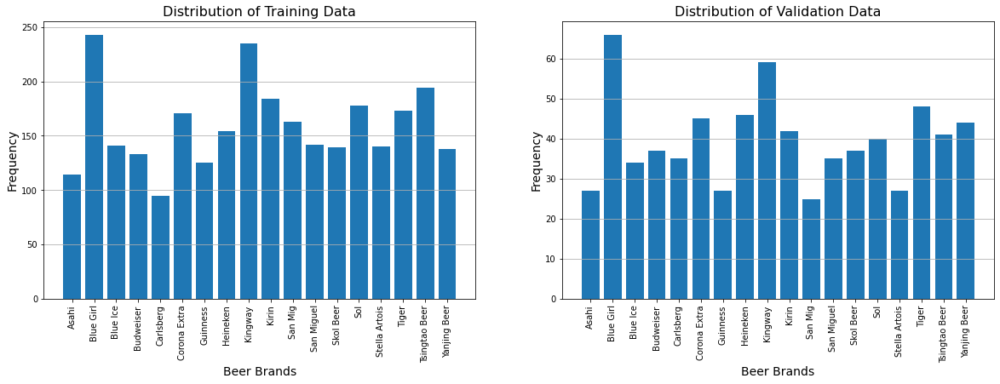

In [ ]:
fig = plt.figure()

fig.patch.set_facecolor('blue')
fig.tight_layout(pad=3.0)
plt.figure(figsize=(20, 6))

plt.subplot(1, 2, 1)
plt.bar(train_dist.keys(), train_dist.values())
plt.xticks(rotation=90)
plt.title('Distribution of Training Data', fontsize=16)
plt.xlabel('Beer Brands', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y')

plt.subplot(1, 2, 2)
plt.bar(val_dist.keys(), val_dist.values())
plt.xticks(rotation=90)
plt.title('Distribution of Validation Data', fontsize=16)
plt.xlabel('Beer Brands', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.grid(axis='y')

plt.show()

## Sample Data

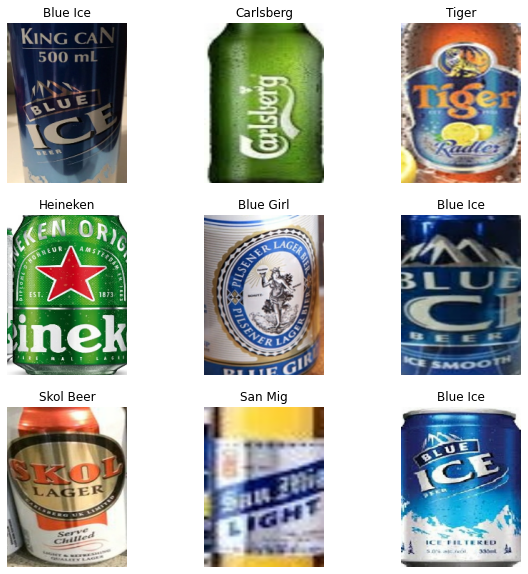

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 224, 168, 3)
(32,)


# Modelling

## Data Augmentation

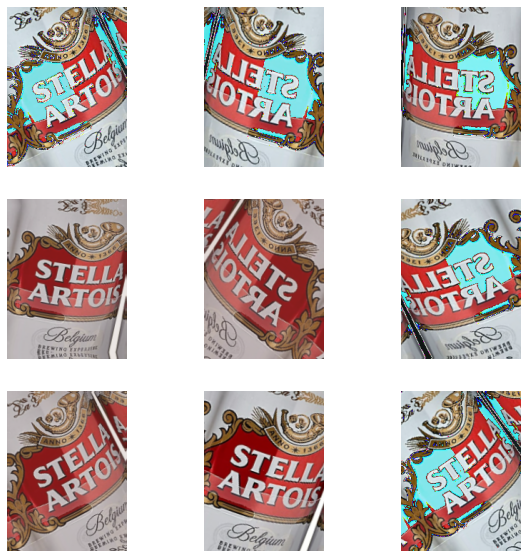

In [ ]:

normalization_layer = tf.keras.layers.experimental.preprocessing.Rescaling(1./255)

data_augmentation = keras.Sequential(
  [
  layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                input_shape=(img_height, 
                                                            img_width,
                                                            3)),
  layers.experimental.preprocessing.RandomRotation(0.1),
  layers.experimental.preprocessing.RandomZoom(0.1, 0.1),
  layers.experimental.preprocessing.RandomContrast(0.3, seed=42)
  ]
)

plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

In [ ]:
options = tf.data.Options()
options.experimental_optimization.autotune_ram_budget = int(1e+10)
train_ds = train_ds.with_options(options)
val_ds = val_ds.with_options(options)

In [ ]:
# AUTOTUNE = tf.data.AUTOTUNE
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

## Parameters (Classes, Epochs, Batch-Size)

In [ ]:
num_classes = len(class_names)
epochs = 500
batch_size = 32

## Baseline Model

In [ ]:
# BASELINE MODEL

# model = tf.keras.Sequential([
#   layers.experimental.preprocessing.Rescaling(1./255),
#   #layers.Conv2D(input_shape=(img_height,img_width,3),filters=64,kernel_size=(2,2),padding="same", activation="relu"),
#   layers.Conv2D(64, 3, activation='relu'),
#   layers.Conv2D(64, 2, activation='relu'),
#   layers.MaxPooling2D(),
#   layers.Conv2D(128, 2, activation='relu'),
#   layers.Conv2D(128, 2, activation='relu'),
#   layers.MaxPooling2D(),
#   layers.Dropout(0.2),
#   layers.Conv2D(32, 3, activation='relu'),
#   layers.MaxPooling2D(),
#   layers.Flatten(),
#   layers.Dense(128, activation='relu'),
#   layers.Dense(num_classes, activation='softmax')
# ])

## Working Model

In [ ]:
# TESTING

model = tf.keras.Sequential([data_augmentation])
model.add(Conv2D(input_shape=(img_height,img_width,3),filters=64,kernel_size=(3,3),padding="same", activation="relu", kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(MaxPooling2D(pool_size=2,)) 
model.add(Dropout(0.2))
model.add(Conv2D(kernel_size = 2, filters = 64, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(Conv2D(kernel_size = 2, filters = 64, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(kernel_size = 2, filters = 128, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(Conv2D(kernel_size = 2, filters = 128, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(MaxPooling2D(pool_size=2))
model.add(Dropout(0.2))
model.add(Conv2D(kernel_size = 2, filters = 256, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(Conv2D(kernel_size = 2, filters = 256, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))
model.add(MaxPooling2D(pool_size = 2))
model.add(Dropout(0.2))
model.add(GlobalMaxPooling2D())
#model.add(GlobalAveragePooling2D())
model.add(Dense(num_classes, activation = 'softmax', kernel_regularizer=regularizers.l1_l2(l1=1e-5, l2=1e-4)))

In [ ]:
optimizer = 'adam'

model.compile(
  optimizer=optimizer,
  loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

# model.compile(
#   optimizer=optimizer,
#   loss='sparse_categorical_crossentropy',
#   metrics=['accuracy'])

In [ ]:
earlyStopping = EarlyStopping(monitor='val_accuracy', patience=50, verbose=0, mode='max')

checkpoint_filepath = '/content/drive/MyDrive/Group Project - Beer Price Checker/test.hdf5'

mcp_save = ModelCheckpoint(checkpoint_filepath, save_best_only=True, monitor='val_accuracy', mode='max')
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=20, verbose=1, min_delta=1e-4, mode='min')

In [ ]:
history = model.fit(train_ds,
                    validation_data=val_ds, 
                    batch_size=batch_size, 
                    epochs=epochs,
                    #callbacks=[earlyStopping, mcp_save],
                    callbacks=[earlyStopping, mcp_save, reduce_lr_loss],
                    )

Epoch 1/500
90/90 [==============================] - 24s 215ms/step - loss: 11.3633 - accuracy: 0.0735 - val_loss: 2.9914 - val_accuracy: 0.1161
Epoch 2/500
90/90 [==============================] - 11s 124ms/step - loss: 2.7526 - accuracy: 0.1688 - val_loss: 2.5563 - val_accuracy: 0.3189
Epoch 3/500
90/90 [==============================] - 11s 124ms/step - loss: 2.2552 - accuracy: 0.3451 - val_loss: 1.9739 - val_accuracy: 0.5007
Epoch 4/500
90/90 [==============================] - 11s 124ms/step - loss: 1.8055 - accuracy: 0.4878 - val_loss: 1.7285 - val_accuracy: 0.5860
Epoch 5/500
90/90 [==============================] - 11s 124ms/step - loss: 1.6352 - accuracy: 0.5556 - val_loss: 1.5792 - val_accuracy: 0.6462
Epoch 6/500
90/90 [==============================] - 11s 124ms/step - loss: 1.3973 - accuracy: 0.6387 - val_loss: 1.2793 - val_accuracy: 0.7189
Epoch 7/500
90/90 [==============================] - 11s 124ms/step - loss: 1.2341 - accuracy: 0.6827 - val_loss: 1.1030 - val_accuracy

## Model Evaluation

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

print(max(acc))
print(max(val_acc))

0.9986023902893066
0.988811194896698


In [ ]:
acc = [i*100 for i in acc]
val_acc = [i*100 for i in val_acc]
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(epochs)


Text(0.5, 1.0, 'Training and Validation Accuracy')

<Figure size 432x288 with 0 Axes>

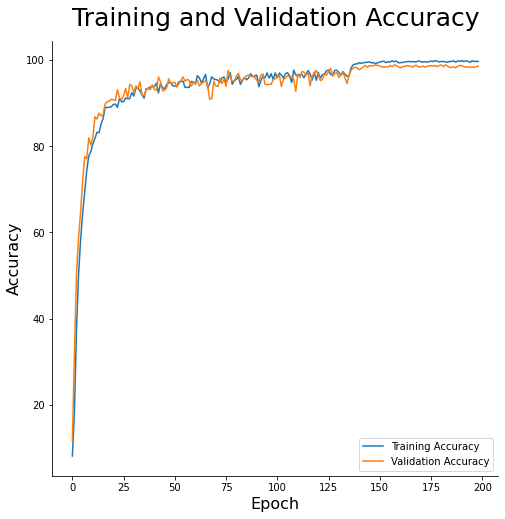

In [ ]:


fig = plt.figure()

fig.patch.set_facecolor('blue')
plt.figure(figsize=(8, 8))

#plt.subplot(1, 2, 1)
plt.plot(range(len(acc)), acc, label='Training Accuracy')
plt.plot(range(len(val_acc)), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
sns.despine(left=False, bottom=False, right=True)
plt.ylabel('Accuracy', fontsize=16)
plt.xlabel('Epoch', fontsize=16)

plt.title('Training and Validation Accuracy', pad=15, fontsize=25)

# plt.subplot(1, 2, 2)
# plt.plot(epochs_range, loss, label='Training Loss')
# plt.plot(epochs_range, val_loss, label='Validation Loss')
# plt.legend(loc='upper right')
# plt.title('Training and Validation Loss')
# plt.show()

# Test Data

In [ ]:
test_dir = pathlib.Path("/content/drive/MyDrive/Group Project - Beer Price Checker/0Test Folder Ori")
TEST = list(test_dir.glob("*"))
print(f'Number of Test Cases: {len(TEST)}')

Number of Test Cases: 108


In [ ]:
model.load_weights(checkpoint_filepath)

model.compile(
  optimizer=optimizer,
  loss=tf.losses.SparseCategoricalCrossentropy(from_logits=True),
  metrics=['accuracy'])

This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 99.99995231628418)
('San Mig', 3.362331995049317e-05)


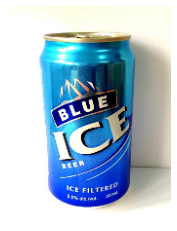

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.77 percent confidence.
('Corona Extra', 99.91437196731567)
('Sol', 0.05107169854454696)


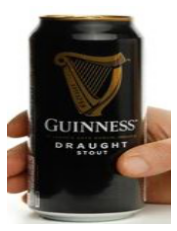

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 99.99998807907104)
('Carlsberg', 1.1583887271626736e-05)


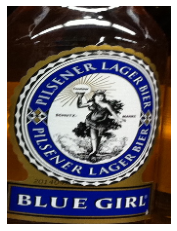

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.79 percent confidence.
('Corona Extra', 100.0)
('Blue Girl', 4.4735926524623257e-13)


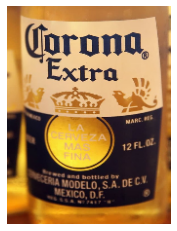

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 8.994900935199723e-08)


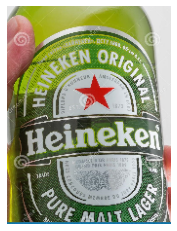

----------------------------------------------
 
This image most likely belongs to Sol with a 13.79 percent confidence.
('Sol', 99.99724626541138)
('Stella Artois', 0.0021416797608253546)


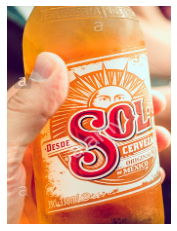

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 100.0)
('Corona Extra', 6.92625319077822e-11)


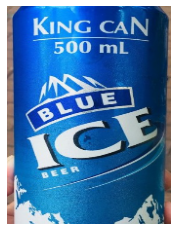

----------------------------------------------
 
This image most likely belongs to Stella Artois with a 13.79 percent confidence.
('Stella Artois', 100.0)
('Skol Beer', 1.5942944187052888e-08)


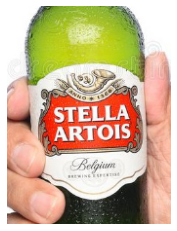

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.78 percent confidence.
('Carlsberg', 99.92863535881042)
('Heineken', 0.07002074271440506)


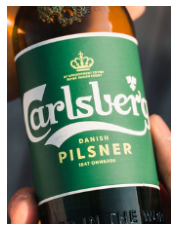

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 99.99994039535522)
('San Miguel', 1.933221795979989e-05)


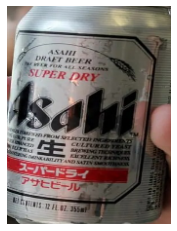

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.66 percent confidence.
('Corona Extra', 99.01178479194641)
('Kingway', 0.6849867291748524)


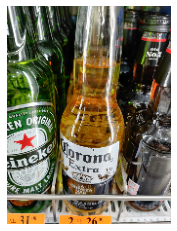

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.78 percent confidence.
('Heineken', 99.99270439147949)
('Kingway', 0.007292259397218004)


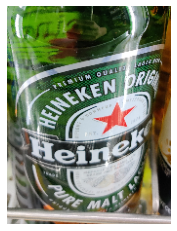

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99998807907104)
('Kingway', 1.7601858814941806e-05)


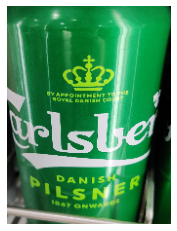

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 99.99953508377075)
('Kingway', 0.00039585820559295826)


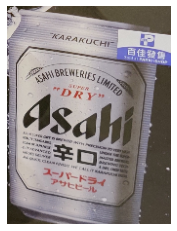

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Tsingtao Beer', 1.933735394032965e-07)


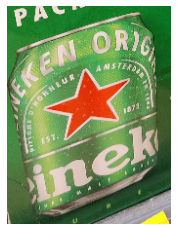

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 9.95636628697838e-09)


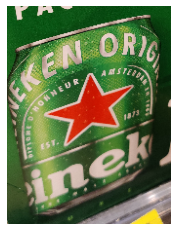

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 100.0)
('Budweiser', 3.871575948721784e-07)


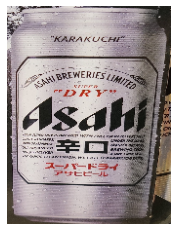

----------------------------------------------
 
This image most likely belongs to Stella Artois with a 13.79 percent confidence.
('Stella Artois', 99.99943971633911)
('Yanjing Beer', 0.000487224178868928)


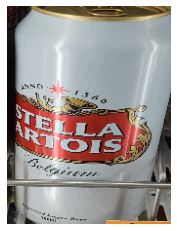

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.78 percent confidence.
('Carlsberg', 99.96408224105835)
('Kingway', 0.03484543121885508)


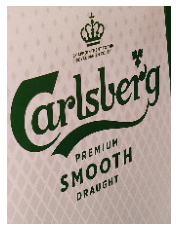

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 4.4608379490274075e-09)


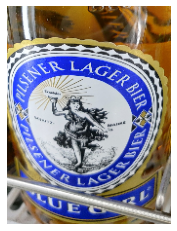

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.79 percent confidence.
('Corona Extra', 100.0)
('Kingway', 7.538477064805704e-08)


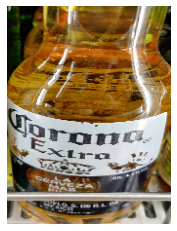

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 99.99988079071045)
('Tiger', 0.00011903601944140974)


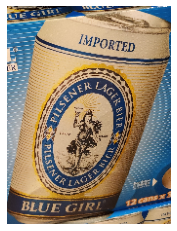

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 99.99785423278809)
('Tiger', 0.0021329156879801303)


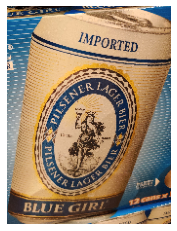

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99581575393677)
('Kingway', 0.0039619564631721005)


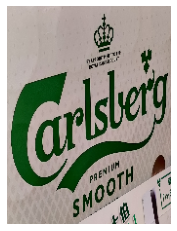

----------------------------------------------
 
This image most likely belongs to Stella Artois with a 13.79 percent confidence.
('Stella Artois', 99.99980926513672)
('Budweiser', 0.0001809990521906002)


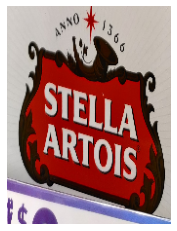

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Carlsberg', 4.543877427098941e-09)


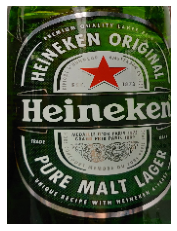

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99991655349731)
('Kingway', 8.235390396293951e-05)


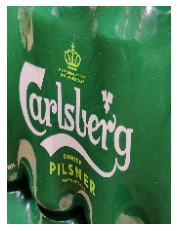

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 1.1930968975911067e-12)


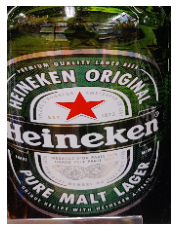

----------------------------------------------
 
This image most likely belongs to San Miguel with a 13.79 percent confidence.
('San Miguel', 100.0)
('Kirin', 8.284743550912577e-10)


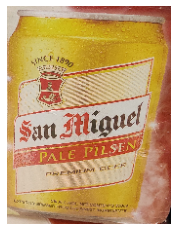

----------------------------------------------
 
This image most likely belongs to Guinness with a 13.79 percent confidence.
('Guinness', 99.99891519546509)
('Corona Extra', 0.0010028153155872133)


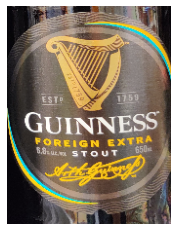

----------------------------------------------
 
This image most likely belongs to Guinness with a 13.79 percent confidence.
('Guinness', 99.99988079071045)
('Corona Extra', 0.0001145020178228151)


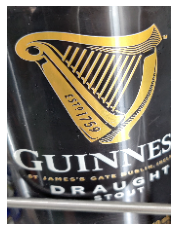

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 1.4776718737508077e-07)


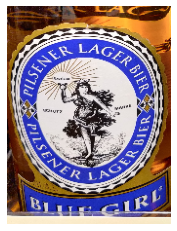

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 2.6827777846460954e-09)


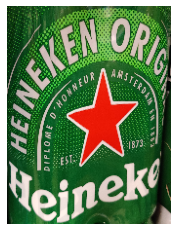

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 7.160141620235483e-11)


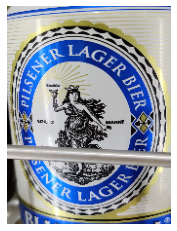

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 11.47 percent confidence.
('Carlsberg', 80.25760054588318)
('Kingway', 18.841104209423065)


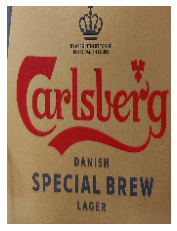

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 2.0238295483920865e-07)


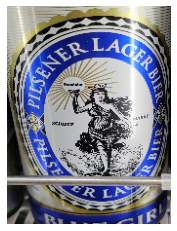

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 99.99994039535522)
('Kingway', 4.292432151942194e-05)


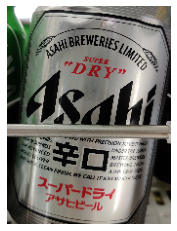

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 3.7581710188305806e-06)


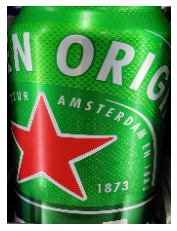

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Tsingtao Beer', 2.429519606328423e-09)


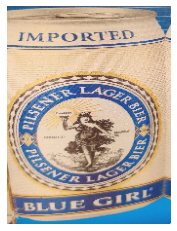

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.78 percent confidence.
('Asahi', 99.95051622390747)
('Yanjing Beer', 0.042760002543218434)


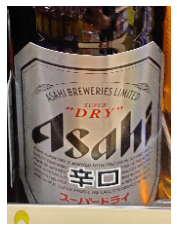

----------------------------------------------
 
This image most likely belongs to Guinness with a 13.79 percent confidence.
('Guinness', 99.99995231628418)
('Blue Ice', 1.588322930956565e-05)


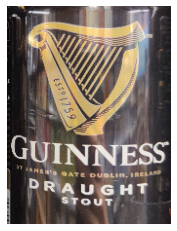

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.78 percent confidence.
('Corona Extra', 99.99058246612549)
('San Miguel', 0.009408091136720031)


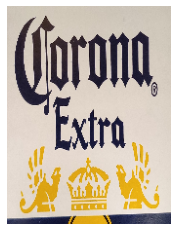

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99998807907104)
('Kingway', 1.7431749199658952e-05)


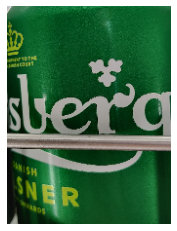

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99964237213135)
('Kingway', 0.00031420834147866117)


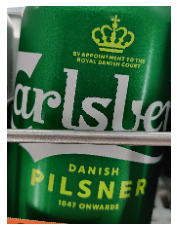

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 100.0)
('San Mig', 6.828246301715524e-10)


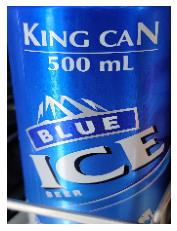

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.78 percent confidence.
('Blue Ice', 99.98538494110107)
('San Mig', 0.014027758152224123)


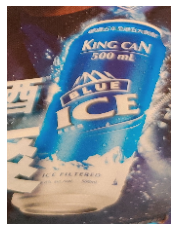

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.70 percent confidence.
('Blue Ice', 99.27977919578552)
('San Mig', 0.6881599314510822)


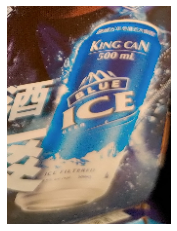

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 100.0)
('San Mig', 1.327620058333423e-06)


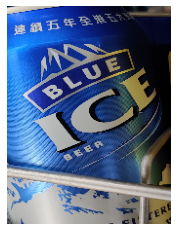

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 2.7934812449337265e-09)


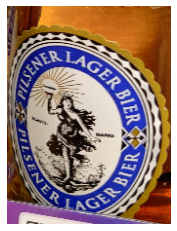

----------------------------------------------
 
This image most likely belongs to Guinness with a 13.78 percent confidence.
('Guinness', 99.99186992645264)
('Corona Extra', 0.008116629760479555)


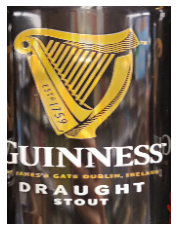

----------------------------------------------
 
This image most likely belongs to Kingway with a 11.63 percent confidence.
('Kingway', 81.60760998725891)
('Budweiser', 12.003134936094284)


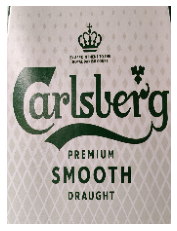

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 9.725255267767352e-07)


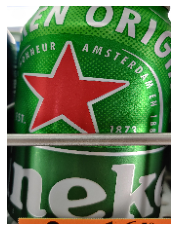

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.77 percent confidence.
('Blue Ice', 99.9150276184082)
('San Mig', 0.08290078840218484)


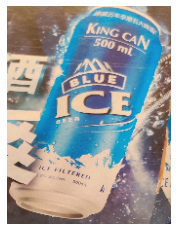

----------------------------------------------
 
This image most likely belongs to Budweiser with a 13.79 percent confidence.
('Budweiser', 99.996817111969)
('Carlsberg', 0.0018862254364648834)


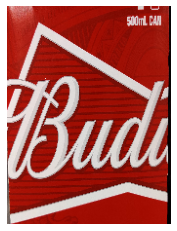

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.76 percent confidence.
('Blue Girl', 99.80145692825317)
('Carlsberg', 0.19853445701301098)


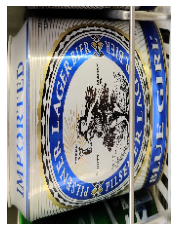

----------------------------------------------
 
This image most likely belongs to Kirin with a 13.78 percent confidence.
('Kirin', 99.9763548374176)
('Sol', 0.011796056060120463)


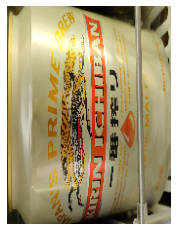

----------------------------------------------
 
This image most likely belongs to Kirin with a 13.09 percent confidence.
('Kirin', 94.38083171844482)
('Carlsberg', 3.5464052110910416)


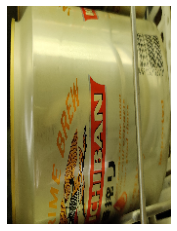

----------------------------------------------
 


/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 282 had too many entries: 2, expected 1
  % (tag, len(values))
/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:590: UserWarning: Metadata Warning, tag 283 had too many entries: 2, expected 1
  % (tag, len(values))


This image most likely belongs to Kirin with a 13.61 percent confidence.
('Kirin', 98.5602617263794)
('San Miguel', 1.3012907467782497)


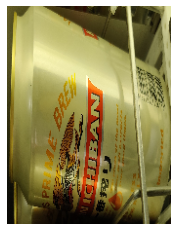

----------------------------------------------
 
This image most likely belongs to Tsingtao Beer with a 13.79 percent confidence.
('Tsingtao Beer', 99.99979734420776)
('San Mig', 0.00019723513560165884)


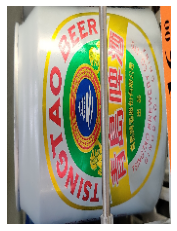

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 3.0629768166257065e-08)


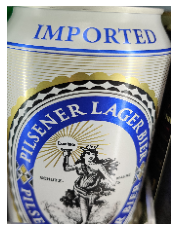

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.99570846557617)
('Kingway', 0.003034908149857074)


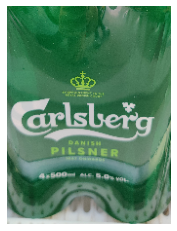

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.78 percent confidence.
('Asahi', 99.99065399169922)
('Kingway', 0.0092273076006677)


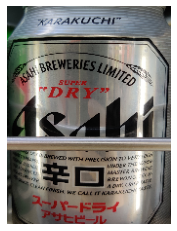

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 100.0)
('San Mig', 6.570854527154779e-07)


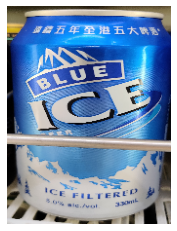

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.71 percent confidence.
('Corona Extra', 99.41945672035217)
('Guinness', 0.5636699963361025)


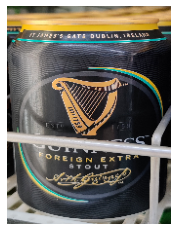

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.76 percent confidence.
('Carlsberg', 99.78950023651123)
('Heineken', 0.1295579131692648)


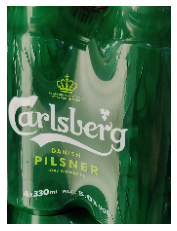

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.77 percent confidence.
('Heineken', 99.86635446548462)
('Kingway', 0.13363293837755919)


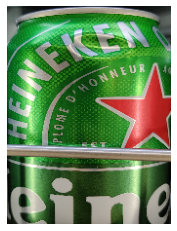

----------------------------------------------
 
This image most likely belongs to Tsingtao Beer with a 13.79 percent confidence.
('Tsingtao Beer', 100.0)
('San Mig', 1.4155600214953764e-12)


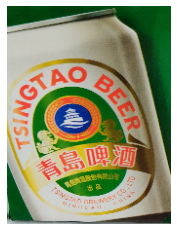

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 99.99585151672363)
('Corona Extra', 0.0035982197005068883)


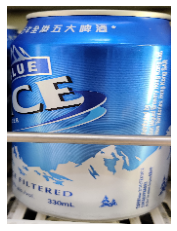

----------------------------------------------
 
This image most likely belongs to Tsingtao Beer with a 13.79 percent confidence.
('Tsingtao Beer', 100.0)
('San Mig', 8.06816419229861e-11)


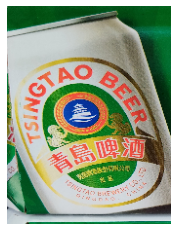

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.01 percent confidence.
('Asahi', 93.65650415420532)
('Budweiser', 2.7961133047938347)


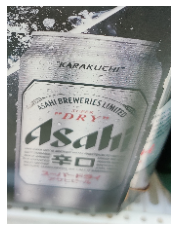

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Blue Ice', 2.35243469148827e-07)


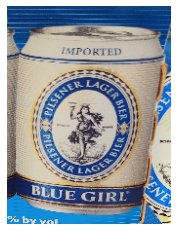

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 99.9953031539917)
('Heineken', 0.0034869295632233843)


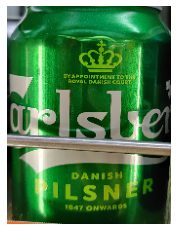

----------------------------------------------
 
This image most likely belongs to Corona Extra with a 13.79 percent confidence.
('Corona Extra', 100.0)
('Blue Girl', 6.6442081003703635e-09)


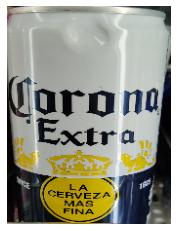

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.79 percent confidence.
('Heineken', 100.0)
('Kingway', 1.3429385381513725e-07)


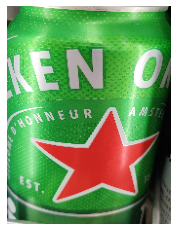

----------------------------------------------
 
This image most likely belongs to Carlsberg with a 13.79 percent confidence.
('Carlsberg', 100.0)
('Kingway', 2.3426434125894957e-06)


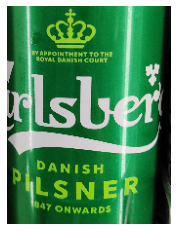

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 100.0)
('San Mig', 1.355033307781639e-08)


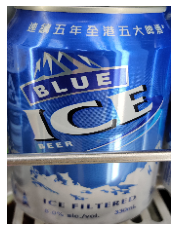

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 99.99724626541138)
('San Mig', 0.002752847103693057)


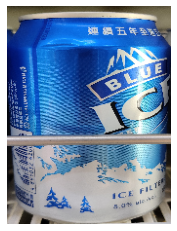

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('Carlsberg', 2.5933168373154514e-10)


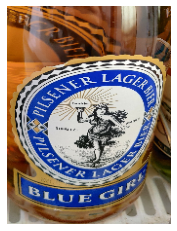

----------------------------------------------
 
This image most likely belongs to Skol Beer with a 13.47 percent confidence.
('Skol Beer', 97.46522903442383)
('Kingway', 1.529881451278925)


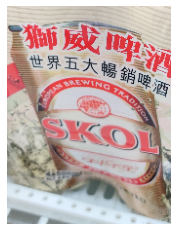

----------------------------------------------
 
This image most likely belongs to Guinness with a 9.99 percent confidence.
('Guinness', 65.67507982254028)
('Blue Ice', 16.52348041534424)


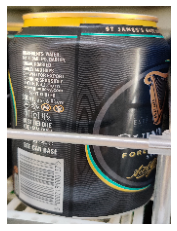

----------------------------------------------
 
This image most likely belongs to San Miguel with a 13.79 percent confidence.
('San Miguel', 100.0)
('Yanjing Beer', 1.1698941134790578e-14)


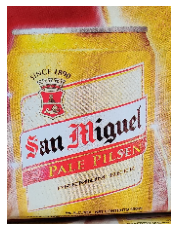

----------------------------------------------
 
This image most likely belongs to Guinness with a 13.79 percent confidence.
('Guinness', 99.99978542327881)
('San Miguel', 0.00021845205537829315)


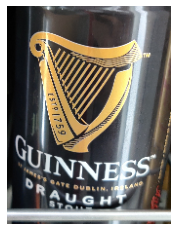

----------------------------------------------
 
This image most likely belongs to Tsingtao Beer with a 13.79 percent confidence.
('Tsingtao Beer', 100.0)
('Tiger', 5.488130430794311e-12)


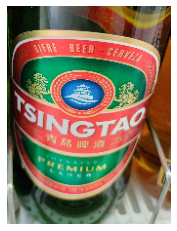

----------------------------------------------
 
This image most likely belongs to Heineken with a 13.61 percent confidence.
('Heineken', 98.6024558544159)
('Kingway', 1.3972585089504719)


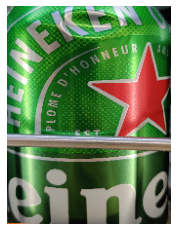

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 100.0)
('Kingway', 2.1098796043617085e-07)


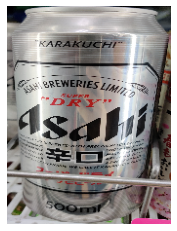

----------------------------------------------
 
This image most likely belongs to Blue Girl with a 13.79 percent confidence.
('Blue Girl', 100.0)
('San Mig', 7.620332316549128e-11)


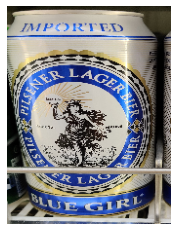

----------------------------------------------
 
This image most likely belongs to Asahi with a 13.79 percent confidence.
('Asahi', 99.99914169311523)
('Yanjing Beer', 0.0006031334123690613)


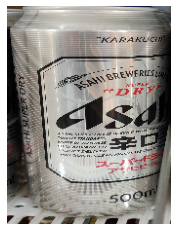

----------------------------------------------
 
This image most likely belongs to Blue Ice with a 13.79 percent confidence.
('Blue Ice', 99.99997615814209)
('San Mig', 2.2166175028814905e-05)


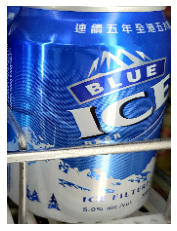

----------------------------------------------
 


In [ ]:

for string in TEST: 

      try:
        original_image = Image.open(str(string)).convert('RGB')
        fixed_image = ImageOps.exif_transpose(original_image)
        image_to_resize = img_to_array(fixed_image)

        resized = tf.image.resize(image_to_resize, [img_height, img_width], method="bilinear",antialias=False)
        img_array = keras.preprocessing.image.img_to_array(resized)

        img_array = tf.expand_dims(img_array, 0) # Create a batch

        predictions = model.predict(img_array)
        score = tf.nn.softmax(predictions[0])

        img_show = tf.squeeze(
            img_array , axis=None, name=None)


        print(
            "This image most likely belongs to {} with a {:.2f} percent confidence."
            .format(class_names[np.argmax(score)], 100 * np.max(score))
        )

        percentages = [i * 100 for i in predictions.tolist()[0]]

        results = zip(class_names, percentages)
        sorted_by_second = sorted(results, key=lambda tup: tup[1],reverse=True)


        for i in sorted_by_second[:2]:
          print(i)

        plt.imshow(resized/255.);
        plt.axis(False);
        plt.show()
        print("----------------------------------------------")
        print(" ")

      except:
        pass

# Save Model

In [ ]:
model.save('/content/drive/MyDrive/Group Project - Beer Price Checker/SINGLE_MAR30MORNv5.h5')